<a href="https://colab.research.google.com/github/Nedcel/PyTorch-NN/blob/main/1_object_counting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intro to Computer Vision with PyTorch (Part 1)
## --- *Object Counting with CNNs* ---

-----
**Tutorial Description**

* Tutorial Overview:
    * *We will use a simple pytorch model (CNN feature extractor to fully connected layer) to determine the number of instances of different classes of objects (shapes) in an image with a simple and flexible dataset of images.*
* Desired Learning Outcome:
    * *Gain intuition for deep learning computer vision tasks with a toy example that can be trained quickly and altered easily.*
* Deep Learning Libraries Used:
    * *pytorch, torchvision, pytorch_lightning, torchmetrics, cv2*

-----
**General Deep Learning and CV Resources**

* [Pytorch docs](https://pytorch.org/docs/stable/index.html)
* [Torchvision docs](https://pytorch.org/vision/stable/index.html)
* [Intro to Pytorch in Google Colab](https://medium.com/dair-ai/pytorch-1-2-quickstart-with-google-colab-6690a30c38d)
* [Intro to Pytorch YouTube Series](https://www.youtube.com/playlist?list=PLhhyoLH6IjfxeoooqP9rhU3HJIAVAJ3Vz)
* [Pytorch Common Mistakes](https://www.youtube.com/watch?v=O2wJ3tkc-TU)
* [Intro to Pytorch Lightning](https://pytorch-lightning.readthedocs.io/en/latest/starter/introduction.html)
* [Debugging with Pytorch Lightning](https://pytorch-lightning.readthedocs.io/en/latest/debug/debugging_basic.html)
* [Deep Learning for Computer Vision](https://www.youtube.com/watch?v=dJYGatp4SvA&list=PLzfU85Pe_4tM17CM5NQ1yMdCdXeD9vBNH&index=6)
* [Definition of Classification vs Detection vs Segmentation](https://www.clarifai.com/blog/classification-vs-detection-vs-segmentation-models-the-differences-between-them-and-how-each-impact-your-results)

-----
**CNN Resources**
* [CNN Wikipedia](https://en.wikipedia.org/wiki/Convolutional_neural_network#Building_blocks)
* [Conv2d Pytorch Docs](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html)
* [Visualize a Kernel Being Applied to an Image](https://stats.stackexchange.com/questions/154798/difference-between-kernel-and-filter-in-cnn)
* [Understanding Pytorch Conv2d Weights and Biases](https://towardsdatascience.com/pytorch-conv2d-weights-explained-ff7f68f652eb)

-----
**Project Links**:
* [project github page](https://github.com/drewbyron/pytorch-tutorials)
* [project youtube channel](https://www.youtube.com/channel/UCORZQS8pVWrPyY3-OpvNkcg)
-----
**Author Info**:
* [github](https://github.com/drewbyron)
* [linked in](https://www.linkedin.com/in/drew-byron/)

## 1.&nbsp;Imports


In [ ]:
%%capture
!pip install torch==1.12.1
!pip install torchtext==0.13.1
!pip install torchvision==0.13.1
!pip install pytorch-lightning==1.6.4
!pip install pytorch-lightning-bolts
!pip install torchmetrics==0.9.1
!pip install matplotlib==3.1.3
!pip install numpy==1.21.6
!pip install ipywidgets==7.7.0

In [ ]:
import torch
torch.__version__

'1.13.1+cu116'

In [ ]:
# Deep learning imports.
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split, TensorDataset

import torchvision
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks, make_grid
from torchvision.ops import masks_to_boxes
import torchvision.transforms.functional as TF
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger

import torchmetrics

# Standard imports.
from typing import List, Union
import gc
import matplotlib.pyplot as plt
import numpy as np
import cv2

# Necessary for creating our images.
from skimage.draw import line_aa

# Interactive widgets for data viz.
import ipywidgets as widgets
from ipywidgets import interact

## 2.&nbsp;Pytorch Dataset

**base classes (identical in each tutorial)**

In [ ]:
class Draw:
    """
    Class used to draw shapes onto images. Methods return coordinates of
    corresponding shape on a 2d np array of shape (img_size, img_size).
    The np rng is used for enabling derministic behaviour.

    Args:
    img_size (int): draws onto 2d array of shape (img_size, img_size).
    rng (Generator): used for enabling deterministic behaviour. Example
        of valid rng: rng = np.random.default_rng(12345)

    """

    def __init__(self, img_size, rng):

        self.img_size = img_size
        self.rng = rng

        return None

    def rectangle(self):
        """
        Returns the image coordinates of a rectangle.
        """
        # Min and max rectangle height.
        a = self.rng.integers(self.img_size * 3 / 20, self.img_size * 7 / 20)
        b = self.rng.integers(self.img_size * 3 / 20, self.img_size * 7 / 20)

        # Initial coordinates of the rectangle.
        xx, yy = np.where(np.ones((a, b)) == 1)

        # Place the rectangle randomly in the image.
        cx = self.rng.integers(0 + a, self.img_size - a)
        cy = self.rng.integers(0 + b, self.img_size - b)

        rectangle = xx + cx, yy + cy

        return rectangle

    def line(self):
        """
        Returns the image coordinates of a line.
        """
        # Randomly choose the start and end coordinates.
        a, b = self.rng.integers(0, self.img_size / 3, size=2)
        c, d = self.rng.integers(self.img_size / 2, self.img_size, size=2)

        # Flip a coin to see if slope of line is + or -.
        coin_flip = self.rng.integers(low=0, high=2)
        # Use a skimage.draw method to draw the line.
        if coin_flip:
            xx, yy, _ = line_aa(a, b, c, d)
        else:
            xx, yy, _ = line_aa(a, d, c, b)

        line = xx, yy

        return line

    def donut(self):
        """
        Returns the image coordinates of an elliptical donut.
        """
        # Define a grid
        xx, yy = np.mgrid[: self.img_size, : self.img_size]
        cx = self.rng.integers(0, self.img_size)
        cy = self.rng.integers(0, self.img_size)

        # Define the width of the donut.
        width = self.rng.uniform(self.img_size / 3, self.img_size)

        # Give the donut some elliptical nature.
        e0 = self.rng.uniform(0.1, 5)
        e1 = self.rng.uniform(0.1, 5)

        # Use the forumula for an ellipse.
        ellipse = e0 * (xx - cx) ** 2 + e1 * (yy - cy) ** 2

        donut = (ellipse < (self.img_size + width)) & (
            ellipse > (self.img_size - width)
        )

        return donut

class CV_DS_Base(torch.utils.data.Dataset):
    """
    Base class for a set of PyTorch computer vision datasets. This class
    contains all of the attributes and methods common to all datasets
    in this package.
    Alone this base class has no functionality. The utility of these datasets
    is that they enable the user to test cv models with very small and
    simple images with tunable complexity. It also requires no downloading
    of images and one can scale the size of the datasets easily.

    Args:
        ds_size (int): number of images in dataset.
        img_size (int): will build images of shape (3, img_size, img_size).
        shapes_per_image (Tuple[int, int]): will produce images containing
            minimum number of shapes Tuple[0] and maximum number of shapes
            Tuple[1]. For example shapes_per_image = (2,2) would create a
            dataset where each image contains exactly two shapes.
        class_probs (Tuple[float, float, float]): relative probability of
            each shape occuring in an image. Need not sum to 1. For example
            class_probs = (1,1,0) will create a dataset with 50% class 1
            shapes, 50% class 2 shapes, 0% class 3 shapes.
        rand_seed (int): used to instantiate a numpy random number generator.
        class_map (Dict[Dict]): the class map must contain keys (0,1,2,3)
            and contain names "background", "rectangle", "line", and "donut".
            "gs_range" specifies the upper and lower bound of the
            grayscale values (0, 255) used to color the shapes.
            "target_color" can be used by visualization tools to assign
            a color to masks and boxes. Note that class 0 is reserved for
            background in most instance seg models, so one can rearrange
            the class assignments of different shapes but 0 must correspond
            to "background". The utility of this Dict is to enable the user
            to change target colors, class assignments, and shape
            intensities. A valid example:
            class_map={
            0: {"name": "background","gs_range": (200, 255),"target_color": (255, 255, 255),},
            1: {"name": "rectangle", "gs_range": (0, 100), "target_color": (255, 0, 0)},
            2: {"name": "line", "gs_range": (0, 100), "target_color": (0, 255, 0)},
            3: {"name": "donut", "gs_range": (0, 100), "target_color": (0, 0, 255)}}.
    """

    def __init__(
        self,
        ds_size,
        img_size,
        shapes_per_image,
        class_probs,
        rand_seed,
        class_map,
    ):

        if img_size <= 20:
            raise ValueError(
                "Different shapes are hard to distinguish for images of shape (3, 20, 20) or smaller."
            )

        if sorted(list(class_map.keys())) != sorted([0, 1, 2, 3]):
            raise ValueError("Dict class_map must contain keys 0,1,2,3.")

        self.ds_size = ds_size
        self.img_size = img_size
        self.rand_seed = rand_seed
        self.shapes_per_image = shapes_per_image
        self.class_probs = np.array(class_probs) / np.array(class_probs).sum()
        self.class_map = class_map

        self.rng = np.random.default_rng(self.rand_seed)

        self.draw = Draw(self.img_size, self.rng)

        self.class_ids = np.array([1, 2, 3])
        self.num_shapes_per_img = self.rng.integers(
            low=self.shapes_per_image[0],
            high=self.shapes_per_image[1] + 1,
            size=self.ds_size,
        )

        self.chosen_ids_per_img = [self.rng.choice(
                a=self.class_ids, size=num_shapes, p=self.class_probs
            ) for num_shapes in self.num_shapes_per_img]

        self.imgs, self.targets = [], []

        return None

    def __getitem__(self, idx):

        return self.imgs[idx], self.targets[idx]

    def __len__(self):

        return len(self.imgs)

    def draw_shape(self, class_id):
        """
        Draws the shape with the associated class_id.
        """

        if self.class_map[class_id]["name"] == "rectangle":
            shape = self.draw.rectangle()
        elif self.class_map[class_id]["name"] == "line":
            shape = self.draw.line()
        elif self.class_map[class_id]["name"] == "donut":
            shape = self.draw.donut()

        else:
            raise ValueError(
                "You must include rectangle, donut, and line in your class_map."
            )

        return shape

**image classification and object counting dataset**

In [ ]:
class ObjectCounting_DS(CV_DS_Base):
    """
    Self contained PyTorch Dataset for testing object counting models.

    Args:
        ds_size (int): number of images in dataset.
        img_size (int): will build images of shape (3, img_size, img_size).
        shapes_per_image (Tuple[int, int]): will produce images containing
            minimum number of shapes Tuple[0] and maximum number of shapes
            Tuple[1]. For example shapes_per_image = (2,2) would create a
            dataset where each image contains exactly two shapes.
        class_probs (Tuple[float, float, float]): relative probability of
            each shape occuring in an image. Need not sum to 1. For example
            class_probs = (1,1,0) will create a dataset with 50% class 1
            shapes, 50% class 2 shapes, 0% class 3 shapes.
        rand_seed (int): used to instantiate a numpy random number generator.
        class_map (Dict[Dict]): the class map must contain keys (0,1,2,3)
            and contain names "background", "rectangle", "line", and "donut".
            "gs_range" specifies the upper and lower bound of the
            grayscale values (0, 255) used to color the shapes.
            "target_color" can be used by visualization tools to assign
            a color to masks and boxes. Note that class 0 is reserved for
            background in most instance seg models, so one can rearrange
            the class assignments of different shapes but 0 must correspond
            to "background". The utility of this Dict is to enable the user
            to change target colors, class assignments, and shape
            intensities. A valid example:
            class_map={
            0: {"name": "background","gs_range": (200, 255),"target_color": (255, 255, 255),},
            1: {"name": "rectangle", "gs_range": (0, 100), "target_color": (255, 0, 0)},
            2: {"name": "line", "gs_range": (0, 100), "target_color": (0, 255, 0)},
            3: {"name": "donut", "gs_range": (0, 100), "target_color": (0, 0, 255)}}.
        object_count (bool): whether or not the targets contain the
            object instance counts or not. Example below under the
            build_imgs_and_targets() method.
    """

    def __init__(
        self,
        ds_size=100,
        img_size=256,
        shapes_per_image=(1, 3),
        class_probs=(1, 1, 1),
        rand_seed=12345,
        class_map={
            0: {
                "name": "background",
                "gs_range": (200, 255),
                "target_color": (255, 255, 255),
            },
            1: {"name": "rectangle", "gs_range": (0, 100), "target_color": (255, 0, 0)},
            2: {"name": "line", "gs_range": (0, 100), "target_color": (0, 255, 0)},
            3: {"name": "donut", "gs_range": (0, 100), "target_color": (0, 0, 255)},
        },
        object_count=False,
    ):

        super().__init__(
            ds_size, img_size, shapes_per_image, class_probs, rand_seed, class_map
        )

        self.object_count = object_count
        self.num_classes = np.max(np.nonzero(self.class_probs)) + 1

        self.imgs, self.targets = self.build_imgs_and_targets()

    def build_imgs_and_targets(self):
        """
        Builds images and targets for object counting.

        Returns:
            imgs (torch.UInt8Tensor[ds_size, 3, img_size, img_size]): images
                containing different shapes. The images are gray-scale
                (each layer of the first (color) dimension is identical).
                This makes it easier to visualize targets and predictions.
            targets (torch.int64[ds_size, num_classes]): targets contian
                either the number of instances of each class (if
                object_count = True) or a binary value representing if
                any of the class are present in the image. For example
                if image i contains 3 instances of class 2 then
                targets[i][1] = 3 if object_count = True and
                targets[i][1] = 1 if object_count = False.
        """
        imgs = []
        targets = []

        for idx in range(self.ds_size):

            chosen_ids = self.chosen_ids_per_img[idx]

            # Creating an empty noisy img.
            img = self.rng.integers(
                self.class_map[0]["gs_range"][0],
                self.class_map[0]["gs_range"][1],
                (self.img_size, self.img_size),
            )

            target = np.zeros(self.num_classes)

            # Filling the noisy img with shapes and building targets.
            for i, class_id in enumerate(chosen_ids):
                shape = self.draw_shape(class_id)
                gs_range = self.class_map[class_id]["gs_range"]
                img[shape] = self.rng.integers(
                    gs_range[0], gs_range[1], img[shape].shape
                )
                target[class_id - 1] += 1

            # Convert from np to torch and assign appropriate dtypes.
            img = torch.from_numpy(img)
            img = img.unsqueeze(dim=0).repeat(3, 1, 1).type(torch.ByteTensor)

            target = torch.from_numpy(target).long()
            if not self.object_count:
                target = torch.clamp(target, max=1)
            imgs.append(img)
            targets.append(target)

        # Turn a list of imgs with shape (3, H, W) of len ds_size to a tensor
        # of shape (ds_size, 3, H, W)
        imgs = torch.stack(imgs)
        targets = torch.stack(targets)

        return imgs, targets

**look at the dataset**

In [ ]:
obj_counting_ds = ObjectCounting_DS(ds_size = 3, shapes_per_image = (0, 9), object_count = True)

for key, value in obj_counting_ds.__dict__.items():
    print(key, ' : ', value)

ds_size  :  3
img_size  :  256
rand_seed  :  12345
shapes_per_image  :  (0, 9)
class_probs  :  [0.33333333 0.33333333 0.33333333]
class_map  :  {0: {'name': 'background', 'gs_range': (200, 255), 'target_color': (255, 255, 255)}, 1: {'name': 'rectangle', 'gs_range': (0, 100), 'target_color': (255, 0, 0)}, 2: {'name': 'line', 'gs_range': (0, 100), 'target_color': (0, 255, 0)}, 3: {'name': 'donut', 'gs_range': (0, 100), 'target_color': (0, 0, 255)}}
rng  :  Generator(PCG64)
draw  :  <__main__.Draw object at 0x7f9db98d0dd0>
class_ids  :  [1 2 3]
num_shapes_per_img  :  [6 2 7]
chosen_ids_per_img  :  [array([3, 3, 2, 1, 2, 1]), array([3, 3]), array([1, 3, 3, 1, 2, 3, 3])]
imgs  :  tensor([[[[217, 211, 217,  ..., 204, 233, 204],
          [218, 248, 203,  ..., 205, 241, 240],
          [204, 233, 244,  ..., 204, 223, 240],
          ...,
          [206, 231, 200,  ..., 241, 206, 209],
          [250, 203, 240,  ..., 224, 235, 239],
          [221, 208, 225,  ..., 235, 219, 236]],

         [[

## 3.&nbsp;Pytorch Lightning Data Module

In [ ]:
class ObjectCounting_DM(pl.LightningDataModule):
    """
    Self contained PyTorch Lightning DataModule for testing object
    counting models with PyTorch Lightning.Uses the torch dataset
    ObjectCounting_DS.

    Args:
        train_val_size (int): total size of the training and validation
            sets combined.
        train_val_split (Tuple[float, float]): should sum to 1.0. For example
            if train_val_size = 100 and train_val_split = (0.80, 0.20)
            then the training set will contain 80 imgs and the validation
            set will contain 20 imgs.
        test_size (int): the size of the test data set.
        batch_size (int): batch size to be input to dataloaders. Applies
            for training, val, and test datasets.
        dataloader_shuffle (Dict): whether or not to shuffle for each of
            the three dataloaders. Dict must contain the keys: "train",
            "val", "test".
        img_size (int): will build images of shape (3, img_size, img_size).
        shapes_per_image (Tuple[int, int]): will produce images containing
            minimum number of shapes Tuple[0] and maximum number of shapes
            Tuple[1]. For example shapes_per_image = (2,2) would create a
            dataset where each image contains exactly two shapes.
        class_probs (Tuple[float, float, float]): relative probability of
            each shape occuring in an image. Need not sum to 1. For example
            class_probs = (1,1,0) will create a dataset with 50% class 1
            shapes, 50% class 2 shapes, 0% class 3 shapes.
        rand_seed (int): used to instantiate a numpy rng.
        class_map (Dict[Dict]): the class map must contain keys (0,1,2,3)
            and contain names "background", "rectangle", "line", and "donut".
            "gs_range" specifies the upper and lower bound of the
            grayscale values (0, 255) used to color the shapes.
            "target_color" can be used by visualization tools to assign
            a color to masks and boxes. Note that class 0 is reserved for
            background in most instance seg models, so one can rearrange
            the class assignments of different shapes but 0 must correspond
            to "background". The utility of this Dict is to enable the user
            to change target colors, class assignments, and shape
            intensities. A valid example:
            class_map={
            0: {"name": "background","gs_range": (200, 255),"target_color": (255, 255, 255),},
            1: {"name": "rectangle", "gs_range": (0, 100), "target_color": (255, 0, 0)},
            2: {"name": "line", "gs_range": (0, 100), "target_color": (0, 255, 0)},
            3: {"name": "donut", "gs_range": (0, 100), "target_color": (0, 0, 255)}}.
        object_count (bool): whether or not the targets contain the
            object instance counts or not. Example below under the
            build_imgs_and_targets() method of the ImageClassification_DS .

    """

    def __init__(
        self,
        train_val_size=100,
        train_val_split=(0.80, 0.20),
        test_size=10,
        batch_size=8,
        dataloader_shuffle={"train": True, "val": False, "test": False},
        img_size=50,
        shapes_per_image=(1, 3),
        class_probs=(1, 1, 1),
        rand_seed=12345,
        class_map={
            0: {
                "name": "background",
                "gs_range": (200, 255),
                "target_color": (255, 255, 255),
            },
            1: {"name": "rectangle", "gs_range": (0, 100), "target_color": (255, 0, 0)},
            2: {"name": "line", "gs_range": (0, 100), "target_color": (0, 255, 0)},
            3: {"name": "donut", "gs_range": (0, 100), "target_color": (0, 0, 255)},
        },
        object_count=True,
    ):

        super().__init__()

        if sorted(list(dataloader_shuffle.keys())) != sorted(["train", "val", "test"]):
            raise ValueError(
                "Dict dataloader_shuffle must contain the keys: train, val, test."
            )
        # Attributes to define datamodule.
        self.train_val_size = train_val_size
        self.train_val_split = np.array(train_val_split)
        self.train_val_sizes = np.array(
            self.train_val_size * self.train_val_split, dtype=int
        )
        self.test_size = test_size
        self.batch_size = batch_size
        self.dataloader_shuffle = dataloader_shuffle

        # Attributes to define dataset.
        self.img_size = img_size
        self.rand_seed = rand_seed
        self.shapes_per_image = shapes_per_image
        self.class_probs = class_probs
        self.class_map = class_map
        self.object_count = object_count

    def setup(self, stage):
        if stage == "fit" or stage is None:
            print("Setting up fit stage.")

            self.train = ObjectCounting_DS(
                ds_size=self.train_val_sizes[0],
                img_size=self.img_size,
                rand_seed=self.rand_seed,
                shapes_per_image=self.shapes_per_image,
                class_probs=self.class_probs,
                class_map=self.class_map,
                object_count=self.object_count,
            )
            self.val = ObjectCounting_DS(
                ds_size=self.train_val_sizes[1],
                img_size=self.img_size,
                rand_seed=self.rand_seed + 111,
                shapes_per_image=self.shapes_per_image,
                class_probs=self.class_probs,
                class_map=self.class_map,
                object_count=self.object_count,
            )

        if stage == "test" or stage is None:
            print("Setting up test stage.")

            self.test = ObjectCounting_DS(
                ds_size=self.test_size,
                img_size=self.img_size,
                rand_seed=self.rand_seed + 222,
                shapes_per_image=self.shapes_per_image,
                class_probs=self.class_probs,
                class_map=self.class_map,
                object_count=self.object_count,
            )

        return None

    def train_dataloader(self):
        return DataLoader(
            self.train,
            batch_size=self.batch_size,
            shuffle=self.dataloader_shuffle["train"],
        )

    def val_dataloader(self):
        return DataLoader(
            self.val,
            batch_size=self.batch_size,
            shuffle=self.dataloader_shuffle["val"],
        )

    def test_dataloader(self):
        return DataLoader(
            self.test,
            batch_size=self.batch_size,
            shuffle=self.dataloader_shuffle["test"],
        )


## 4.&nbsp;Visualize Data

**show images**

In [ ]:
def show(imgs, figsize=(10.0, 10.0)):
    """Displays a single image or list of images. Taken more or less from
    the pytorch docs:
    https://pytorch.org/vision/main/auto_examples/plot_visualization_utils.html#visualizing-a-grid-of-images

    Args:
        imgs (Union[List[torch.Tensor], torch.Tensor]): A list of images
            of shape (3, H, W) or a single image of shape (3, H, W).
        figsize (Tuple[float, float]): size of figure to display.

    Returns:
        None
    """

    if not isinstance(imgs, list):
        imgs = [imgs]
    fig, axs = plt.subplots(ncols=len(imgs), figsize=figsize, squeeze=False)
    for i, img in enumerate(imgs):
        img = img.detach()
        img = TF.to_pil_image(img)
        axs[0, i].imshow(np.asarray(img))
        axs[0, i].set(xticklabels=[], yticklabels=[], xticks=[], yticks=[])
    plt.show()

    return None

**example of show function**

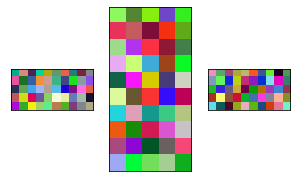

In [ ]:
imgs = [torch.rand((3, 5,10)),torch.rand((3, 10, 5)), torch.rand((3, 5, 10))]
show(imgs, figsize = (5, 5) )

**add labels to images**

In [ ]:
def add_labels(img, label, class_map, pred=False, object_count=False):
    """Takes a single image of shape (3, H, W) and adds labels directly
    onto the image using cv2. Used with ImageSegmentation_DS/DM but can
    be used in other applicable computer vision tasks.

    Args:
        img (torch.UInt8Tensor[3, H, W]): a pytorch image.
        label (torch.int64[ds_size, num_classes]): label contians
                either the number of instances of each class (if object_count
                = True) or a binary value representing if
                any of the class are present in the image. For example
                if the image contains 3 instances of class 2 then
                label[1] = 3 if object_count = True and
                label[1] = 1 if object_count = False. Note that here 0 is
                not a valid class so if your class_map contains keys
                0,1,2,3,4 then num_classes = 4.
        class_map (Dict[Dict]): the class map must contain keys that
            correspond to the labels provided. Inner Dict must contain
            "name" and "target_color". class 0 is reserved for the case
            where the image contains no objects (label.sum() == 0).
            A valid example:
            class_map={
            0: {"name": "background","target_color": (255, 255, 255),},
            1: {"name": "rectangle", "target_color": (255, 0, 0)},
            2: {"name": "line", "target_color": (0, 255, 0)},
            3: {"name": "donut", "target_color": (0, 0, 255)}}.
        pred (bool): whether or not the label provided is a prediction.
            Predictions are printed in the bottom right of the image
            whereas targets are printed in the top left.
        object_count (bool): whether or not the label contains the
            object instance counts or not. See above under label for an
            example.


    Returns:
        img (torch.UInt8Tensor[3, H, W]): a pytorch image with the names
            (and possibly counts) corresponding to the provided label
            drawn over the image.
    """
    img_size = img.shape[-1]
    img = img.permute(1, 2, 0).cpu().numpy().astype(np.uint8).copy()

    if label.sum() == 0:

        nonzero_classes = [0]
        label_colors = [class_map[0]["target_color"]]
        img_labels = ["background"]

    else:

        nonzero_classes = label.cpu().numpy().nonzero()[0] + 1
        label_colors = [class_map[indx]["target_color"] for indx in nonzero_classes]

        if object_count:
            img_labels = [
                class_map[indx]["name"] + ": {}".format(label[indx - 1])
                for indx in nonzero_classes
            ]
        else:
            img_labels = [class_map[indx]["name"] for indx in nonzero_classes]

    scaling_ratio = img_size / 512

    font = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 1 * scaling_ratio
    thickness = 1
    lineType = 1

    y0, x0, dy = 27 * scaling_ratio, 10 * scaling_ratio, 27 * scaling_ratio
    if pred:
        y0, x0 = 400 * scaling_ratio, 315 * scaling_ratio
        thickness = 2

    for i, (img_label, label_color, c) in enumerate(
        zip(img_labels, label_colors, nonzero_classes)
    ):
        y = y0 + c * dy
        fontColor = label_color

        cv2.putText(
            img,
            img_label,
            (int(x0), int(y)),
            font,
            fontScale,
            fontColor,
            thickness,
            lineType,
        )

    img = torch.from_numpy(img).permute(2, 0, 1)

    return img

**visualize a batch of images and targets**

In [ ]:
%matplotlib inline
style = {'description_width': 'initial'}

@interact
def vizualize_label_targets(img_size = widgets.IntSlider(style= style,value=256,min=128,max=1000,step=1, description = "img_size"),
                            shapes_per_img_lo = widgets.IntSlider(style=style,value=3,min=0,max=10,step=1, description = "shapes_per_img_lo"),
                            shapes_per_img_hi = widgets.IntSlider(style= style, value=6,min=0,max=10,step=1, description = "shapes_per_img_hi"),
                            class_prob_1 =  widgets.IntSlider(style= style,value=1,min=0,max=10,step=1, description = "class_prob_1"),
                            class_prob_2 =  widgets.IntSlider(style=style,value=1,min=0,max=10,step=1, description = "class_prob_2"),
                            class_prob_3 =  widgets.IntSlider(style= style,value=1,min=0,max=10,step=1, description = "class_prob_3"),
                            gs_range_0_lo = widgets.IntSlider(style= style,value=200,min=0,max=255,step=1, description = "gs_range_0_lo"),
                            gs_range_0_hi = widgets.IntSlider(style= style,value=255,min=0,max=255,step=1, description = "gs_range_0_hi"),
                            gs_range_1_lo = widgets.IntSlider(style= style,value=0,min=0,max=255,step=1, description = "gs_range_1_lo"),
                            gs_range_1_hi = widgets.IntSlider(style= style,value=100,min=0,max=255,step=1, description = "gs_range_1_hi"),
                            rand_seed = widgets.IntSlider(style= style,value=1232,min=1230,max=1239,step=1, description = "rand_seed"),
                            display_size = widgets.IntSlider(style= style, value=30,min=5,max=50,step=1),
                            show_labels = widgets.Checkbox(style= style,value=False,description='target labels'),
                            object_count = widgets.Checkbox(style= style,value=True,description='object_count')
                            ):


    obj_counting_dm = ObjectCounting_DM(
                                    train_val_size = 10,
                                    img_size = img_size,
                                    train_val_split = (.6, .4),
                                    shapes_per_image = (shapes_per_img_lo, shapes_per_img_hi),
                                    class_probs=(class_prob_1, class_prob_2, class_prob_3),
                                    rand_seed=rand_seed,
                                    class_map={
                                        0: {"name": "background", "gs_range": (gs_range_0_lo, gs_range_0_hi), "target_color": (255,255,255)},
                                        1: {"name": "rectangle", "gs_range": (gs_range_1_lo, gs_range_1_hi), "target_color": (255, 0, 0)},
                                        2: {"name": "line", "gs_range": (0, 100), "target_color": (0, 255, 0)},
                                        3: {"name": "donut", "gs_range": (0, 100), "target_color": (0, 0, 255)},
                                    },
                                    dataloader_shuffle={"train": False, "val": False, "test": False},
                                    object_count = object_count,
                                       )

    # Visualize and understand some random images
    obj_counting_dm.setup(stage = "fit")
    dataiter = iter(obj_counting_dm.train_dataloader())

    imgs, labels = dataiter.next()

    result_images = [imgs[i] for i in range(len(imgs))]

    if show_labels:
        result_images = [add_labels(img, label, obj_counting_dm.class_map, object_count = object_count, pred = False) for img, label in zip(imgs, labels)]

    grid = make_grid(result_images)
    show(grid, figsize = (display_size, display_size))

interactive(children=(IntSlider(value=256, description='img_size', max=1000, min=128, style=SliderStyle(descri…

## 5.&nbsp;Model


**define model**

In [ ]:
class DoubleConv(nn.Module):
    """
    A double convolution module used to extract features.

    Args:
        in_channels (int): number of input channels. For example for an
            input of shape (batch_size, 3, img_size, img_size) in_channels
            is 3.
        out_channels (int): number of output_channels desired. For example
            if the desired output shape is (batch_size, 3, img_size, img_size)
            in_channels is 3.
        kernel_size (int): A kernel of shape (kernel_size, kernel_size)
            will be applied to the imgs during both Conv2d layers.
        bias (bool): whether or not to add a bias to the Conv2d layers.
    """

    def __init__(self, in_channels, out_channels, kernel_size=3, bias=True):

        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride=1,
                padding="same",
                bias=bias,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(
                out_channels,
                out_channels,
                kernel_size,
                stride=1,
                padding="same",
                bias=bias,
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


class ObjectCounter(nn.Module):
    """An object counting model that uses multiple conv layers and then
    two fully connected layers to determine how many instances of different
    classes of objects (shapes) are in an image.

    Args:
        img_size (int): model will take images of shape
            (3, img_size, img_size).
        in_channels (int): number of input channels. For example for an
            put of shape (batch_size, 3, img_size, img_size) in_channels
            is 3.
        num_classes (int): number of output classes desired. The output
            shape of the model will be (batch_size, num_classes).
        features (List[int]): A list specifying the number of features to
            be used in each DoubleConv layer. Note that for the model to
            work the image_size must be divisable by {(2** len(features))}.
        kernel_size (int): A kernel of shape (kernel_size, kernel_size)
            will be applied to the imgs during both Conv2d layers.
        fc_intermediate_size (int): Size of the output of the first
            fully connected layer (fc1) and size of the input of the second
            fully connected layer (fc2).
        bias (bool): whether or not to add a bias to the Conv2d layers.
        track_x_shape (bool): whether or not to track the shape of x.
    """

    def __init__(
        self,
        img_size=256,
        in_channels=3,
        num_classes=3,
        features=[16, 32],
        kernel_size=3,
        fc_intermediate_size=10,
        bias=True,
        track_x_shape=False,
    ):

        super().__init__()

        self.img_size = img_size
        self.in_channels = in_channels
        self.num_classes = num_classes
        self.features = features
        self.kernel_size = kernel_size
        self.fc_intermediate_size = fc_intermediate_size
        self.bias = True
        self.track_x_shape = track_x_shape

        final_size = self.img_size / (2 ** len(self.features))

        if (final_size % 1) != 0:
            raise ValueError(f"image_size must be divisable by {(2** len(features))}.")

        self.final_size = int(final_size)
        self.final_feature_size = self.features[-1]
        self.fc_in_size = self.final_feature_size * self.final_size**2

        self.sigmoid = nn.Sigmoid()
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(self.fc_in_size, self.fc_intermediate_size)
        self.fc2 = nn.Linear(self.fc_intermediate_size, self.num_classes)
        self.feature_extractor = nn.ModuleList()

        if self.track_x_shape:
            self.x_shape_tracker = []

        # Feature extractor
        for feature in features:
            self.feature_extractor.append(
                DoubleConv(
                    in_channels, feature, kernel_size=self.kernel_size, bias=self.bias
                )
            )
            in_channels = feature

    def forward(self, x):
        self.track_shape( x, "input shape")
        for i, module in enumerate(self.feature_extractor):

            x = module(x)
            self.track_shape( x, f"feature_extractor layer {i}")
            x = self.pool(x)
            self.track_shape( x, f"max pool layer {i}")

        x = x.reshape(x.shape[0], -1)
        self.track_shape( x, "reshape")

        x = self.fc1(x)
        self.track_shape( x, "fc1")

        x = self.relu(x)
        self.track_shape( x, "relu")

        x = self.fc2(x)
        self.track_shape( x, "fc2 (output shape)")

        return x

    def track_shape(self, x, description):
        if self.track_x_shape:
            self.x_shape_tracker.append((f"{description}:\n\t {x.shape}"))

        return None

**sanity check model**

In [ ]:
img_size = 256
batch_size = 13

x = torch.rand((batch_size, 3, img_size,img_size))

model = DoubleConv(3, 4, kernel_size = 11)
logits = model(x)
print(f"Input shape: {x.shape} " )
print(f"Output shape: {logits.shape}")

Input shape: torch.Size([13, 3, 256, 256]) 
Output shape: torch.Size([13, 4, 256, 256])


In [ ]:
model = ObjectCounter(img_size = img_size, in_channels = 3, num_classes = 2, features=[7,11,15], kernel_size = 7, track_x_shape = True )
logits = model(x)

print("model.x_shape_tracker: \n")
for shape in model.x_shape_tracker:
    print(shape, "\n")

print(f"Example output: {logits[0]}\n")

print(f"model.final_size: {model.final_size}")
print(f"model.final_feature_size: {model.final_feature_size}")
print(f"model.fc_in_size: {model.fc_in_size}\n")

print(model.feature_extractor[0].conv[0])
print(model.feature_extractor[0].conv[0].weight.shape)
print(model.feature_extractor[0].conv[0].bias.shape)

model.x_shape_tracker: 

input shape:
	 torch.Size([13, 3, 256, 256]) 

feature_extractor layer 0:
	 torch.Size([13, 7, 256, 256]) 

max pool layer 0:
	 torch.Size([13, 7, 128, 128]) 

feature_extractor layer 1:
	 torch.Size([13, 11, 128, 128]) 

max pool layer 1:
	 torch.Size([13, 11, 64, 64]) 

feature_extractor layer 2:
	 torch.Size([13, 15, 64, 64]) 

max pool layer 2:
	 torch.Size([13, 15, 32, 32]) 

reshape:
	 torch.Size([13, 15360]) 

fc1:
	 torch.Size([13, 10]) 

relu:
	 torch.Size([13, 10]) 

fc2 (output shape):
	 torch.Size([13, 2]) 

Example output: tensor([0.5433, 0.0467], grad_fn=<SelectBackward0>)

model.final_size: 32
model.final_feature_size: 15
model.fc_in_size: 15360

Conv2d(3, 7, kernel_size=(7, 7), stride=(1, 1), padding=same)
torch.Size([7, 3, 7, 7])
torch.Size([7])


## 6.&nbsp;Overfit a Small Batch


**overfit function**

In [ ]:
def overfit(imgs, labels, model, optimizer,  device,  epochs= 100):

    loss_fn = nn.MSELoss().to(device)

    model = model.to(device)
    model.train()

    # Formatting for input to model.
    imgs_normed = imgs.float() / 255.0
    imgs_normed = imgs_normed.to(device)
    labels = labels.float().to(device)

    for epoch in range(epochs):

        logits = model(imgs_normed).to(device)
        loss = loss_fn(logits, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if epoch %25 == 0:
            print(f"epoch: {epoch}")
            print(f"loss: {loss:.6f}\n")

    return None

**small batch to overfit**

In [ ]:
obj_counting_dm = ObjectCounting_DM(
                                train_val_size = 10,
                                img_size = 256,
                                batch_size=4,
                                train_val_split = (.8,.2),
                                shapes_per_image = (0,4),
                                class_probs=(1,1,1),
                                rand_seed= 123456,
                                object_count = True,
                                class_map={
                                    0: {"name": "background", "gs_range": (200, 255), "target_color": (255,255,255)},
                                    1: {"name": "rectangle", "gs_range": (0, 100), "target_color": (255, 0, 0)},
                                    2: {"name": "line", "gs_range": (0, 100), "target_color": (0, 255, 0)},
                                    3: {"name": "donut", "gs_range": (0, 100), "target_color": (0, 0, 255)},
                                },
                                dataloader_shuffle={"train": False, "val": False, "test": False},
                                    )

# Visualize and understand some random images
obj_counting_dm.setup(stage = "fit")
dataiter = iter(obj_counting_dm.train_dataloader())

imgs, labels = dataiter.next()

Setting up fit stage.


**run overfit function**

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = ObjectCounter(img_size = imgs.shape[-1], in_channels = 3, num_classes = 3, features=[4,8], fc_intermediate_size = 10, bias = True )
optimizer = torch.optim.Adam(model.parameters(), lr=3e-6)
overfit(imgs, labels, model, optimizer,  device, epochs = 1000)

epoch: 0
loss: 0.878362

epoch: 25
loss: 0.486412

epoch: 50
loss: 0.321101

epoch: 75
loss: 0.222054

epoch: 100
loss: 0.163664

epoch: 125
loss: 0.129482

epoch: 150
loss: 0.107598

epoch: 175
loss: 0.091379

epoch: 200
loss: 0.077918

epoch: 225
loss: 0.066172

epoch: 250
loss: 0.055798

epoch: 275
loss: 0.046682

epoch: 300
loss: 0.038731

epoch: 325
loss: 0.031865

epoch: 350
loss: 0.025995

epoch: 375
loss: 0.021026

epoch: 400
loss: 0.016863

epoch: 425
loss: 0.013410

epoch: 450
loss: 0.010577

epoch: 475
loss: 0.008364

epoch: 500
loss: 0.006755

epoch: 525
loss: 0.005449

epoch: 550
loss: 0.004371

epoch: 575
loss: 0.003487

epoch: 600
loss: 0.002766

epoch: 625
loss: 0.002182

epoch: 650
loss: 0.001711

epoch: 675
loss: 0.001334

epoch: 700
loss: 0.001034

epoch: 725
loss: 0.000796

epoch: 750
loss: 0.000609

epoch: 775
loss: 0.000464

epoch: 800
loss: 0.000351

epoch: 825
loss: 0.000263

epoch: 850
loss: 0.000197

epoch: 875
loss: 0.000146

epoch: 900
loss: 0.000107

epoch:

**get predictions**

In [ ]:
model.eval()

# Formatting for input to model.
imgs_normed = imgs.float() / 255.0
imgs_normed = imgs_normed.to(device)
with torch.no_grad():
    logits = model(imgs_normed)

preds = logits.round().long().to(device)
print(f"\nlogits:\n {logits}")
print(f"\npreds:\n {preds}")
print(f"\nlabels:\n {labels}")


logits:
 tensor([[-4.4663e-04,  1.3470e-02,  1.0626e-02],
        [ 1.0003e+00,  9.9687e-01,  9.9749e-01],
        [ 1.0005e+00,  9.9710e-01,  1.9962e+00],
        [ 3.3673e-04,  9.9651e-01, -2.9422e-03]], device='cuda:0')

preds:
 tensor([[0, 0, 0],
        [1, 1, 1],
        [1, 1, 2],
        [0, 1, 0]], device='cuda:0')

labels:
 tensor([[0, 0, 0],
        [1, 1, 1],
        [1, 1, 2],
        [0, 1, 0]])


**visualize overfit predictions**

In [ ]:
%matplotlib inline
@interact
def vizualize_targets_predictions(
                                 show_labels = widgets.Checkbox(value=False,description='display_labels'),
                                 show_preds = widgets.Checkbox(value=False,description='display_preds'),
                                 display_size = widgets.IntSlider(value=30,min=2,max=50,step=1),
                                ):

    result_images = [imgs[i] for i in range(len(imgs))]

    if  show_labels:
        result_images = [add_labels(img, label, obj_counting_dm.class_map, object_count = True) for img, label in zip(result_images, labels)]
    if  show_preds:
        result_images = [add_labels(img, pred, obj_counting_dm.class_map, object_count = True, pred = True) for img, pred in zip(result_images, preds)]

    grid = make_grid(result_images)
    show(grid, figsize = (display_size,display_size))

interactive(children=(Checkbox(value=False, description='display_labels'), Checkbox(value=False, description='…

## 7.&nbsp;Build Lightning Module



In [ ]:
class LightningObjCounter(pl.LightningModule):

    def __init__(self, in_channels=3, num_classes=3, img_size = 256, features = [4,8], kernel_size = 3, fc_intermediate_size = 10, bias = True, lr = 5e-6):
        super().__init__()

        # LM attributes.
        self.in_channels = in_channels
        self.num_classes = num_classes
        self.img_size = img_size
        self.features = features
        self.kernel_size = kernel_size
        self.fc_intermediate_size = fc_intermediate_size
        self.bias = True
        self.lr = lr

        # Log hyperparameters.
        self.save_hyperparameters()

        # Metrics.
        self.train_acc = torchmetrics.Accuracy( mdmc_average = 'samplewise')
        self.train_f1 = torchmetrics.F1Score( mdmc_average = 'samplewise')
        self.val_acc = torchmetrics.Accuracy( mdmc_average = 'samplewise')
        self.val_f1 = torchmetrics.F1Score( mdmc_average = 'samplewise')

        # Loss function.
        self.loss = nn.MSELoss()

        # Model.
        self.model = ObjectCounter(img_size = self.img_size,
                                    in_channels = self.in_channels,
                                    num_classes = self.num_classes,
                                    features = self.features,
                                    kernel_size = self.kernel_size,
                                    fc_intermediate_size = self.fc_intermediate_size,
                                    bias = self.bias )

        # Sample input. Used for logging the model graph.
        self.example_input_array = torch.rand(16,3,self.img_size, self.img_size)

    def forward(self, imgs):

        imgs_normed = imgs.float() / 255.0
        return self.model(imgs_normed)

  # Utility function.
    def custom_histogram_adder(self):
        # iterating through all parameters
        for name,params in self.named_parameters():
            self.logger.experiment.add_histogram(name,params,self.current_epoch)

    def mse_loss(self, logits, labels):
        labels = labels.float()
        return self.loss(logits, labels)

    def training_step(self, train_batch, batch_idx):

        # Grab images and labels from batch.
        imgs, labels = train_batch

        logits = self.forward(imgs)

        # Calculate loss.
        loss = self.mse_loss(logits, labels)

        preds = logits.clamp(min = 0).round().long()
        # Log step metrics.
        self.train_acc(preds, labels)
        self.train_f1(preds, labels)

        self.log('Loss/train_loss', loss)
        self.log('Acc/train_acc', self.train_acc, on_step = True)
        self.log('F1/train_f1', self.train_f1, on_step = True)

        return loss


    def validation_step(self, val_batch, batch_idx):

        # Log histograms.
        if batch_idx ==0:
            self.custom_histogram_adder()

        # Grab images and labels from batch.
        imgs, labels = val_batch
        # labels = F.one_hot(labels, num_classes = self.max_class_occurance+1)

        logits = self.forward(imgs)

        # Calculate loss.
        loss = self.mse_loss(logits, labels)

        preds = logits.clamp(min = 0).round().long()
        # Log step metrics.
        self.val_acc(preds, labels)
        self.val_f1(preds, labels)

        self.log('Loss/val_loss', loss)
        self.log('Acc/val_acc', self.val_acc, on_step = True)
        self.log('F1/val_f1', self.val_f1, on_step = True)

    def configure_optimizers(self):
        # Remember to make the optim input self.model.parameters()!
        optimizer = torch.optim.Adam(self.model.parameters(), lr=self.lr)
        return optimizer



## 8.&nbsp; Train



**define trainer**

In [ ]:
# Create a datamodule.
obj_counting_dm = ObjectCounting_DM(
                                train_val_size = 7000,
                                img_size = 256,
                                train_val_split = (.9,.1),
                                test_size = 100,
                                batch_size = 16,
                                dataloader_shuffle={"train": True, "val": True, "test": False},
                                shapes_per_image = (0,3),
                                class_probs=(1,1,0),
                                rand_seed= 23456,
                                class_map={
                                    0: {"name": "background", "gs_range": (240, 255), "target_color": (0,0,0)},
                                    1: {"name": "rectangle", "gs_range": (0, 50), "target_color": (255, 0, 0)},
                                    2: {"name": "line", "gs_range": (50, 100), "target_color": (0, 255, 0)},
                                    3: {"name": "donut", "gs_range": (100, 125), "target_color": (0, 0, 255)},
                                },
                                object_count = True,
                                )

# Create callback for ModelCheckpoints.
checkpoint_callback = ModelCheckpoint(filename='{epoch:02d}', save_top_k = 50, monitor = "Loss/val_loss", every_n_epochs = 1)

# Create Instance of Lightning Module.
obj_counting_lm = LightningObjCounter(in_channels = 3,
                                        num_classes = 2,
                                        img_size = obj_counting_dm.img_size,
                                        features = [8,12],
                                        kernel_size = 3,
                                        fc_intermediate_size = 10,
                                        lr = 1e-6)

# Define Logger.
logger = TensorBoardLogger("tb_logs", name="object_counting", log_graph = True)

# -----------Set device.------------------
device = "gpu" if torch.cuda.is_available() else "cpu"

# Create an instance of a Trainer.
trainer = pl.Trainer(logger = logger, callbacks = [checkpoint_callback], accelerator = device, max_epochs = 50, log_every_n_steps = 5)

# Fit.
trainer.fit(obj_counting_lm , obj_counting_dm)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


Setting up fit stage.


INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name      | Type          | Params | In sizes          | Out sizes
----------------------------------------------------------------------------
0 | train_acc | Accuracy      | 0      | ?                 | ?        
1 | train_f1  | F1Score       | 0      | ?                 | ?        
2 | val_acc   | Accuracy      | 0      | ?                 | ?        
3 | val_f1    | F1Score       | 0      | ?                 | ?        
4 | loss      | MSELoss       | 0      | ?                 | ?        
5 | model     | ObjectCounter | 494 K  | [16, 3, 256, 256] | [16, 2]  
----------------------------------------------------------------------------
494 K     Trainable params
0         Non-trainable params
494 K     Total params
1.978     Total estimated model params size (MB)


Sanity Checking: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:481: PossibleUserWarning: Your `val_dataloader`'s sampler has shuffling enabled, it is strongly recommended that you turn shuffling off for val/test/predict dataloaders.
  category=PossibleUserWarning,


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


**tensorboard**

In [ ]:
# Note: If using firefox turn off enhanced tracking protection for the following to work.
%load_ext tensorboard
%tensorboard --logdir tb_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1450), started 0:00:07 ago. (Use '!kill 1450' to kill it.)

<IPython.core.display.Javascript object>

## 9.&nbsp; Visualize Predictions


**get test set**

In [ ]:
obj_counting_dm.setup(stage = "test")
test_dataiter = iter(obj_counting_dm.test_dataloader())

Setting up test stage.


**execute following cell again to see more test data**

In [ ]:
imgs, labels = test_dataiter.next()

**visualize predictions on test set**

In [ ]:
%matplotlib inline
version = 0

@interact
def vizualize_labels_preds( epoch = widgets.IntSlider(value=49,min=0,max=49,step=1),
                                 show_labels = widgets.Checkbox(value=False,description='display_labels'),
                                 show_preds = widgets.Checkbox(value=True,description='display_preds'),
                                 display_size = widgets.IntSlider(value=30,min=2,max=50,step=1),
                        ):

    PATH = '/content/tb_logs/object_counting/version_{}/checkpoints/epoch={:02d}.ckpt'.format(version, epoch)
    loaded_lm = LightningObjCounter.load_from_checkpoint(PATH)

    with torch.no_grad():
        logits = loaded_lm(imgs)
    preds = logits.round().long()

    result_images = [imgs[i] for i in range(len(imgs))]

    if  show_labels:
        result_images = [add_labels(img, label, obj_counting_dm.class_map, object_count = True) for img, label in zip(result_images, labels)]
    if  show_preds:
        result_images = [add_labels(img, pred, obj_counting_dm.class_map, pred = True, object_count = True) for img, pred in zip(result_images, preds)]

    grid = make_grid(result_images)
    show(grid, figsize = (display_size,display_size))

interactive(children=(IntSlider(value=49, description='epoch', max=49), Checkbox(value=False, description='dis…

**visualize first conv layer**

In [ ]:
%matplotlib inline
version = 0

@interact
def vizualize_labels_preds( epoch = widgets.IntSlider(value=49,min=0,max=49,step=1),
                            display_size = widgets.IntSlider(value=20,min=2,max=50,step=1),
                        ):

    PATH = '/content/tb_logs/object_counting/version_{}/checkpoints/epoch={:02d}.ckpt'.format(version, epoch)
    loaded_lm = LightningObjCounter.load_from_checkpoint(PATH)

    kernels = loaded_lm.model.feature_extractor[0].conv[0].weight.data.clone()

    kernel_list = [kernel/ kernel.mean() for kernel in kernels]

    show(kernel_list, figsize = (display_size, display_size))

    print(f"Shape of first conv layer weights: {kernels.shape}")

interactive(children=(IntSlider(value=49, description='epoch', max=49), IntSlider(value=20, description='displ…

## 10.&nbsp; Conclusion

**what was covered**

* Built a from scratch implimentation of an object counting model.
* Trained the model on a simple and flexible data set.
* Started getting the hang of pytorch-lightning.
* Visualized a conv2d layer.

**how to use these classes and functions in your own projects**


* *Use the below cells to build a simple sandbox and try things out yourself!*
* Things to investigate:
    * What happens if you add more layers and more features to the object counting model?
    * What happens if you increase the amount of examples in the data set?
    * What happens if your dataset includes only one class (`class_probs=(1,0,0)` in data module) vs all three (`class_probs=(1,1,1)` in data module))?
    * What happens if you have imbalanced classes ( for example `class_probs = (10,1,1)` in data module)?


In [ ]:
%%capture
! pip install pytorch-tutorials==0.2.19
! pip install torch == 1.12.1
! pip install torchvision == 0.13.1

In [ ]:
# torch imports
import torch
from torchvision.utils import make_grid

# pytorch_tutorials imports
import pytorch_tutorials
from pytorch_tutorials.intro_to_computer_vision import cv_utility
from pytorch_tutorials.intro_to_computer_vision import cv_datasets
from pytorch_tutorials.intro_to_computer_vision import cv_models
from pytorch_tutorials.intro_to_computer_vision import cv_pl_data_modules

In [ ]:
print(pytorch_tutorials.__version__)
print(pytorch_tutorials.__description__)
print(pytorch_tutorials.__url__)

('0.2.15',)
('A resource for learning about PyTorch and deep learning.',)
('https://github.com/drewbyron/pytorch-tutorials',)


**get data module**

Setting up fit stage.


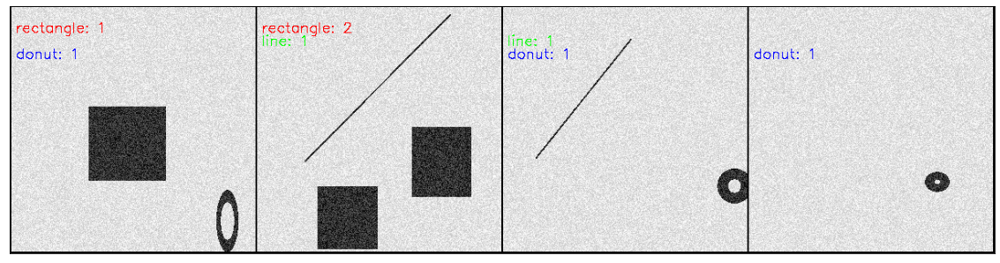

In [ ]:
obj_counting_dm = cv_pl_data_modules.ObjectCounting_DM(batch_size=4, img_size = 300)

# Visualize and understand some random images
obj_counting_dm.setup(stage = "fit")
dataiter = iter(obj_counting_dm.train_dataloader())

imgs, labels = dataiter.next()

result_images = [cv_utility.add_labels(img, label, obj_counting_dm.class_map, pred = False, object_count=True) for img, label in zip(imgs, labels)]

grid = make_grid(result_images)
cv_utility.show(grid, figsize = (20,20))

**get model**

In [ ]:
img_size = 256
x = torch.rand((16, 3, img_size,img_size))

model = cv_models.DoubleConv(3, 4, kernel_size = 11)
logits = model(x)
print(f"Input shape: {x.shape} " )
print(f"Output shape: {logits.shape}")

model = cv_models.ObjectCounter(img_size = img_size, in_channels = 3, num_classes = 2, features=[7,11,15], kernel_size = 7)
logits = model(x)
print(f"\nInput shape: {x.shape} " )
print(f"Output shape: {logits.shape}")
print(f"Example output: {logits[0]}\n")


Input shape: torch.Size([16, 3, 256, 256]) 
Output shape: torch.Size([16, 4, 256, 256])

Input shape: torch.Size([16, 3, 256, 256]) 
Output shape: torch.Size([16, 2])
Example output: tensor([-0.2276,  0.5258], grad_fn=<SelectBackward0>)



---
**That's it!**